This Colab Notebook was the basis for all our training with YoloV5. We had trained multiple other models before however we had not realised they were being trained with a IoU threshold of 0.20 . This would lead to innacurate predictions so we changed this parameter and went on with our analysis.

# Important: 

As we were not able to produce a good enough size distribution plot to compare our distributions with gruond truth, we will be using the following metrics for our evaluation: 

- Precision is the number of true positive detections (correctly detected craters) divided by the sum of true positive and false positive detections (all detections that were claimed as craters). It measures the accuracy of positive detections.

- Recall: Recall is the number of true positive detections divided by the sum of true positive and false negative detections (craters that were not detected). It measures the completeness of the detections.

- mAP50: mAP50 (mean Average Precision at IoU threshold of 0.5) is the average precision score over all craters, computed at an Intersection over Union (IoU) threshold of 0.5. It measures the performance of the object detector in terms of precision and recall.

- F1 Score: The F1 score is the harmonic mean of precision and recall. It is a single score that balances the trade-off between precision and recall and is commonly used as a single performance metric for binary classification problems.

# Basic Imports and Setups: 

- Mount Drive and classic imports
- Setup TensorBoard

In [1]:
# Mount the drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Change directory: 
%cd drive/MyDrive/yolov5

/content/drive/MyDrive/yolov5


In [ ]:
# Install the requirements for YoloV and other Imports
%pip install -qr requirements.txt  # install

import torch
import utils
display = utils.notebook_init()  # checks

YOLOv5 🚀 v7.0-72-g064365d Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (NVIDIA A100-SXM4-40GB, 40536MiB)


Setup complete ✅ (12 CPUs, 83.5 GB RAM, 23.6/166.8 GB disk)


In [ ]:
# Setup TensorBoard: 
def tensorboard_check():
  %load_ext tensorboard
  %tensorboard --logdir runs/train

In [ ]:
tensorboard_check()

<IPython.core.display.Javascript object>

# Start of Training: 

Our Tuning Process: 
- Try all the pretrained models given to us by YoloV5
  - Small, medium, high.
    - We did not have enough time to look into the extra-large model - But we did when we were training our models with a 0.2 IoU threshold and it did not perform as well as the other models (plus took longer to train).

- Choose the best Model from there, and try and do some transfer learning by freezing the backbone.
  - In this training example, we decided to freeze the backbone as the backbone is where most of the feature extraction is being done - adn as it was well trained and optimised using the coco dataset, we decided to put more focus on training the Neck layers and the output layers, which are the main layers for assigning if a feature which is found in the backbone is a crater or not.
  - After first training our model with frozen backbone, we then trained the same model again, this time with no frozen layers, for less epochs. 


- After comparing the results, we then tried to do some ensemble training: 


Comment: 
- We tried implementing the YoloV5 evolve function, which finds the optimised hyperparameters for you, however this methods requires lots of computing time and computing resources. We ran it for a couple generations (about 50) and it did not show any improvements. The metrics we chose to maximise was mAP50, as this metric tests for stability as well as optimising both precision and recall. It did not give us any insight on hyperparameters to tune as we did not run it for long enough (it suggested 300-400 generations).

- However, we did not think this was going to be an issue as the hyperparamters already given to us by YoloV5 we optimised and YoloV5 had implementations that changes them automatically.



## Small Pretrained YoloV5 Model: 
- First thing we did was check all the model.yaml files and change the number of classes in each to 1 (took a while to find this).
- We then created a new Data yaml file called mars.yaml, which had the appropriate folder directories for the train, val, and test sets.
  - Inside the data yaml file we also changed the number of classes to 1.
  - To repeat our data was split with 0.8 of the images for training, 0.1 for validation and the other 0.1 for test. Eventhough this split may be quite extreme seing we have so little data (800), we wanted to have many images for training.

- We then created a new hyperparameter file called hyp_IoU50, which had the IoU threshold set to 0.5 for training.


Now that we have all the files setup we ran our first training set on the mars data.

- We used the same hyperparameters that were present for the hyp_med given by YoloV5 as these were seen to perform the best (when using threshold 0.2).

- We used the maximum batchsize as possible (auto-calculated by YoloV5) so that we could reach faster convergence. As we had great memory access with the Colab GPUs, this did not lead to us having memory issues.

- We initially chose 50 epochs for the small model as a try.

- We also kept the size of the image to be that of our training data. That is 416x416, as a to numbers such as 320x320 wouldv'e have been bad, as YoloV5 would have to crop the images to be that size, letting smaller images being inputed in all the convolution layers of the architecture. This would have led to worst results, and we have evidence of this when we trained with the dataset given to us by Gareth (See that Colab Folder).

In [ ]:
!python train.py --img 416 --cfg yolov5s.yaml --hyp /content/drive/MyDrive/yolov5/data/hyps/hyp_IoU50 --batch -1 --epochs 50 --data mars.yaml --weights yolov5s.pt --name running_model_baseline_Mars_05_IoU --single-cls 

train: weights=yolov5s.pt, cfg=yolov5s.yaml, data=mars.yaml, hyp=/content/drive/MyDrive/yolov5/data/hyps/hyp_IoU50, epochs=50, batch_size=-1, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=True, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=running_model_baseline_Mars_05_IoU, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-72-g064365d Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (NVIDIA A100-SXM4-40GB, 40536MiB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.3, cls_pw=1.0, obj=0.7, obj_pw=1.0, iou_

We can now plot the training curves, to see if we our model has reached convergence: 

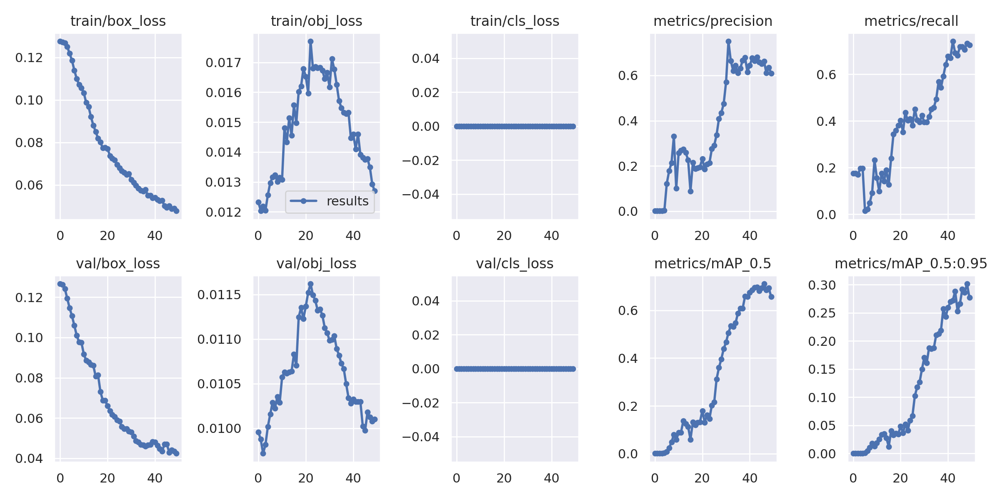

In [2]:
# Visualise the training Curves: 
from IPython.display import Image
Image(filename='/content/drive/MyDrive/yolov5/runs/train/running_model_baseline_Mars_05_IoU/results.png')

### Observations: 
- From the train and val curves, we can see that our model has not yet converged. 
- We can notice that it is close to converging though as the train/box curve is going down at a great rate.
- We notive that the class loss is always 0. This is because we only have 1 class in our data - the craters.
- Looking at our metrics, it seems that our model has stagnated with Precision 55% and recall of 70% on the validation set.

We can see from the above plots, that our model has not yet reached convergence - It is close though. We should've reran the model for longer (potentially 100 epochs) but decided to try the next Medium Sized model next. This time with 100 epochs.

- Let's test our model on our test set (Which was configured in the mars.yaml file).

In [ ]:
!python val.py --weights /content/drive/MyDrive/yolov5/runs/train/running_model_baseline_Mars_05_IoU/weights/best.pt --data mars.yaml --img 416 --task test

val: data=/content/drive/MyDrive/yolov5/data/mars.yaml, weights=['/content/drive/MyDrive/yolov5/runs/train/running_model_baseline_Mars_05_IoU/weights/best.pt'], batch_size=32, imgsz=416, conf_thres=0.001, iou_thres=0.6, max_det=300, task=test, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-72-g064365d Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (NVIDIA A100-SXM4-40GB, 40536MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
test: Scanning /content/drive/MyDrive/yolov5/datasets/mars_sorted/labels/test.cache... 80 images, 0 backgrounds, 0 corrupt: 100% 80/80 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95:   0% 0/3 [00:00<?, ?it/s]tensor([0.77329, 0.72879, 0.66748, 0.62386, 0.54376, 0.52107, 0.43962, 0.39134, 0.36169, 0.34

From the above test set, we can see that our model performed quite poorly, with a precision of 55% and recall of 67%. Another metric we paid close attention to was the mAP50 metric. This metric stands for mean average precision with a 50% IoU threshold. This metric shows a balance between recall and precision and having a high mAP50 metric suggests that our model is accurately detecting craters with high precision.


From this initial training, we have decided multiple things for our optimisation process: 

- Test all the pretrained models from YoloV5 with over 50 epochs
- Check not only for higher precision and recall but also high mAP50.

## Medium Model: 

After trying the small pretrained model, we trained the middle sized pretrained model. Using the same hyperparameters and image size, however this time with 100 epochs, to make sure our model converges.

In [ ]:
!python train.py --img 416 --cfg yolov5m.yaml --hyp hyps/hyp.scratch-med.yaml --batch -1 --epochs 100 --data mars.yaml --weights yolov5m.pt --name running_model_medium_05_IoU --single-cls 

train: weights=yolov5m.pt, cfg=yolov5m.yaml, data=mars.yaml, hyp=hyps/hyp.scratch-med.yaml, epochs=100, batch_size=-1, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=True, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=running_model_medium_05_IoU, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-72-g064365d Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (NVIDIA A100-SXM4-40GB, 40536MiB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.3, cls_pw=1.0, obj=0.7, obj_pw=1.0, iou_t=0.5, anchor_t=4.0, fl_gamma=

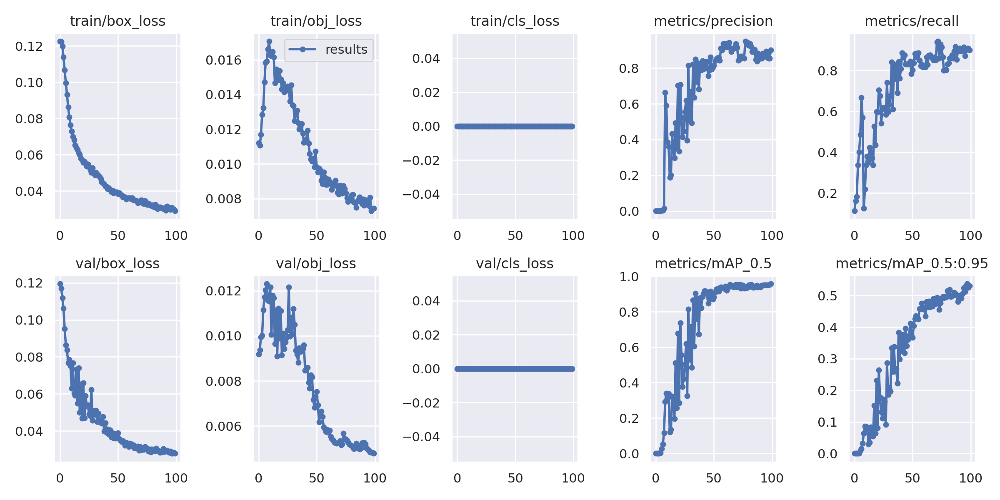

In [3]:
Image(filename='/content/drive/MyDrive/yolov5/runs/train/running_model_medium_05_IoU/results.png')

As we can see from the above plots, our model has converged nicely, with both the box loss and object loss coming to minimum values. We can also see that the metrics have stabilised at high values. 

We can also notive that our model is not yet overfitting. Which is good. We think 100 epochs is enough for this model as the loss curves seem to have stabilised (or at least close for the object_loss).

Let's evaluate our model with the test set: 



In [ ]:
!python val.py --weights /content/drive/MyDrive/yolov5/runs/train/running_model_medium_05_IoU/weights/best.pt --data mars.yaml --img 416 --task test

val: data=/content/drive/MyDrive/yolov5/data/mars.yaml, weights=['/content/drive/MyDrive/yolov5/runs/train/running_model_medium_05_IoU/weights/best.pt'], batch_size=32, imgsz=416, conf_thres=0.001, iou_thres=0.6, max_det=300, task=test, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-72-g064365d Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (NVIDIA A100-SXM4-40GB, 40536MiB)

Fusing layers... 
YOLOv5m summary: 212 layers, 20852934 parameters, 0 gradients, 47.9 GFLOPs
test: Scanning /content/drive/MyDrive/yolov5/datasets/mars_sorted/labels/test.cache... 80 images, 0 backgrounds, 0 corrupt: 100% 80/80 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95:   0% 0/3 [00:00<?, ?it/s]tensor([0.55719, 0.26705], device='cuda:0')
tensor([0.68699], device='cuda:0')
tensor([0.71013], de

From the validation on the test set, we can see that the important metrics to us are quite high. Higher than using the small model. With Precision at 89% and precision at 85%. Our mAP50 is also quite high at 90%, which tells us that our model is predicting the craters accuratly with high precision.


Let's visualise some plots: 

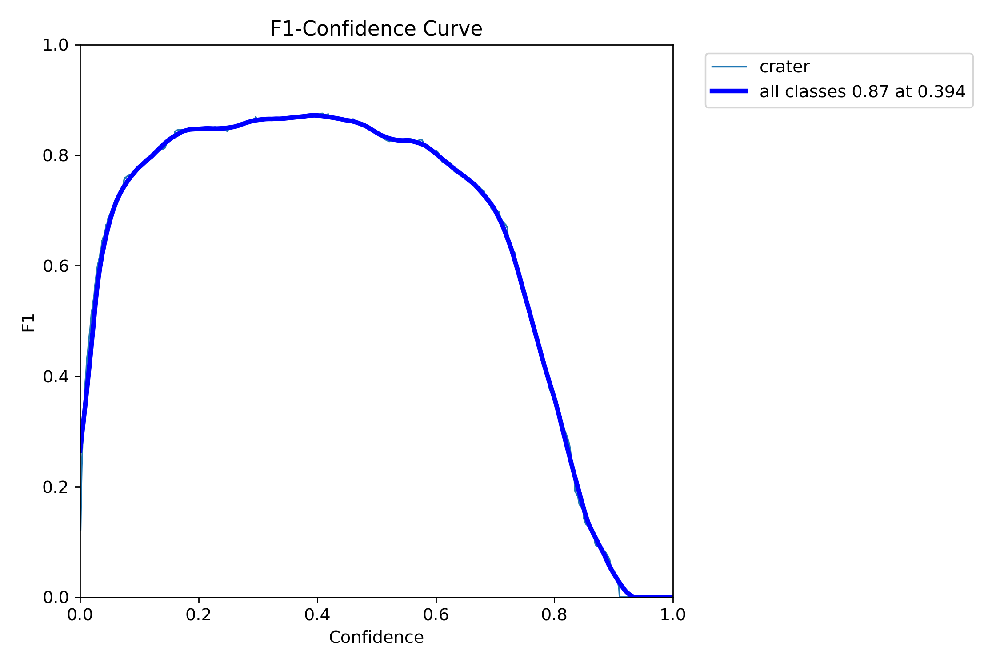

In [4]:
Image(filename='/content/drive/MyDrive/yolov5/runs/val/exp35/F1_curve.png')

We can see from our above F1 curve, that we have a good balance between precision and recall, which suggests good model performance.

This good balance in F1 and high recall tells us our model is predicting correct craters in our images. 

Let's look at some example predictions from the validation on test set: 

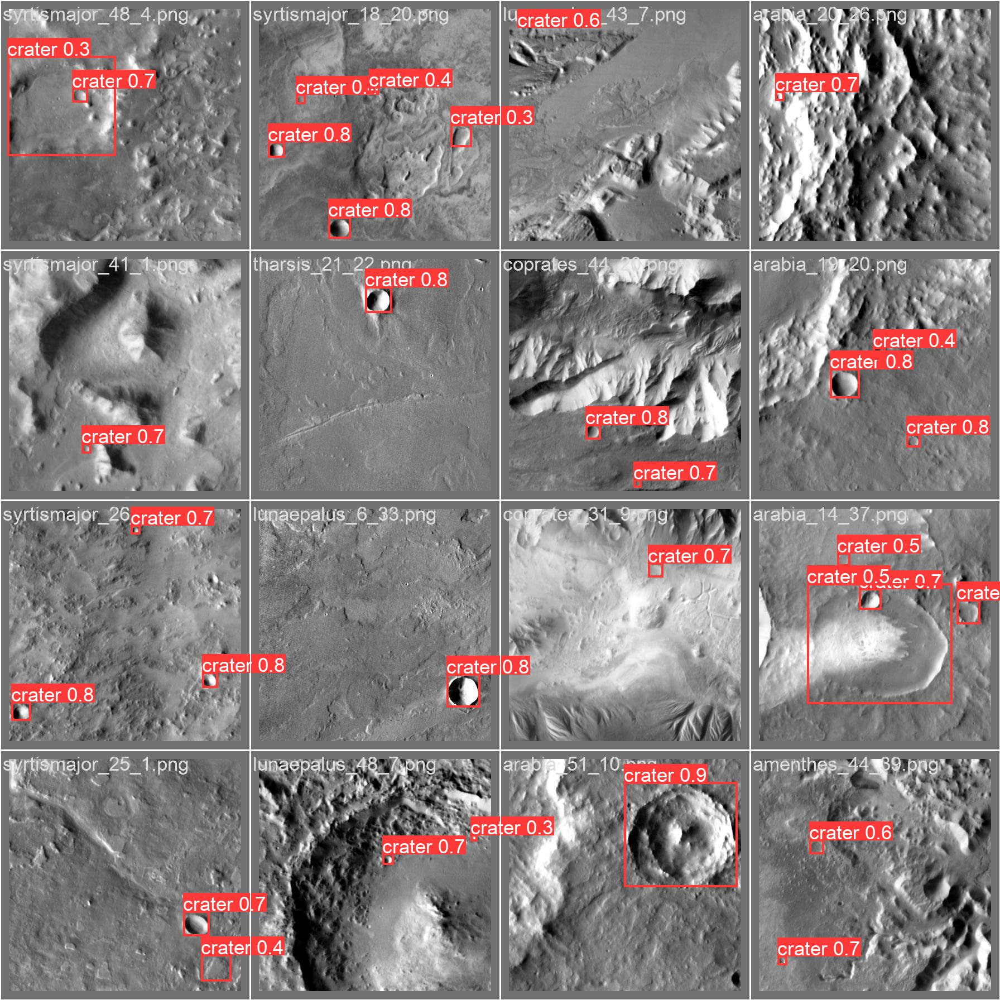

In [5]:
Image(filename='/content/drive/MyDrive/yolov5/runs/val/exp35/val_batch1_pred.jpg')

From the above predictions we can see that the model is predicting good craters, even on rough terrain. Great news for our training.

## Large model: 

Using the same image size, but this time the High hyperparamters (still with 0.5 IoU threshold) over 100 epochs:  

In [ ]:
!python train.py --img 416 --cfg yolov5l.yaml --hyp hyps/hyp.scratch-high.yaml --batch -1 --epochs 100 --data mars.yaml --weights yolov5l.pt --name running_model_large_05_IoU --single-cls 

train: weights=yolov5l.pt, cfg=yolov5l.yaml, data=mars.yaml, hyp=hyps/hyp.scratch-high.yaml, epochs=100, batch_size=-1, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=True, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=running_model_large_05_IoU, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-72-g064365d Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (NVIDIA A100-SXM4-40GB, 40536MiB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.3, cls_pw=1.0, obj=0.7, obj_pw=1.0, iou_t=0.5, anchor_t=4.0, fl_gamma=

The model is looking okay: Let's look at the training curves: 

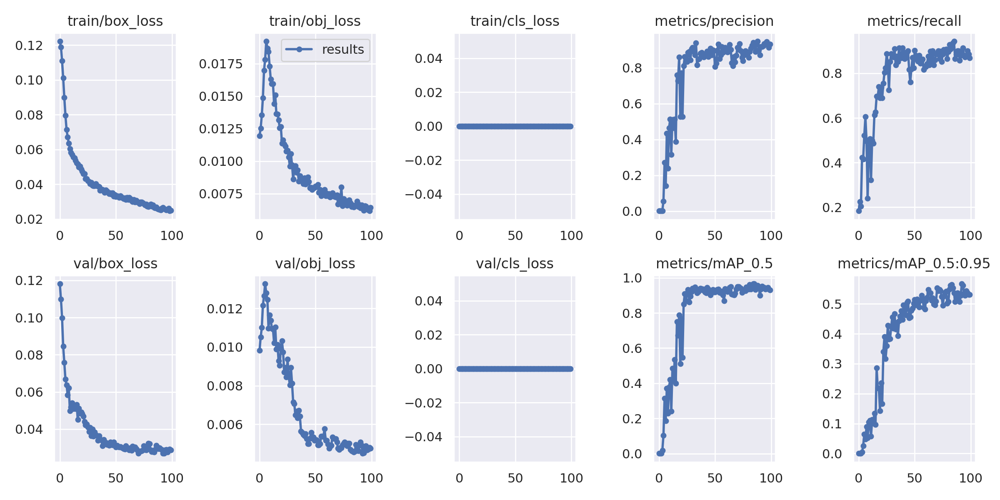

In [6]:
Image(filename='/content/drive/MyDrive/yolov5/runs/train/running_model_large_05_IoU/results.png')

We can see that our model has converged correctly (maybe could've run on a couple more epochs as the train_box_loss curve is not all the way converged) But the validation curve had converged. I think running more epochs would've led to overfitting of the boxes (Training curve keeps decreasing but valudation curve starts to increase).

The metrics seem to be great, let's check its performance on the test set.

In [ ]:
!python val.py --weights /content/drive/MyDrive/yolov5/runs/train/running_model_large_05_IoU/weights/best.pt --data mars.yaml --img 416 --task test

val: data=/content/drive/MyDrive/yolov5/data/mars.yaml, weights=['/content/drive/MyDrive/yolov5/runs/train/running_model_large_05_IoU/weights/best.pt'], batch_size=32, imgsz=416, conf_thres=0.001, iou_thres=0.6, max_det=300, task=test, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-72-g064365d Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (NVIDIA A100-SXM4-40GB, 40536MiB)

Fusing layers... 
YOLOv5l summary: 267 layers, 46108278 parameters, 0 gradients, 107.6 GFLOPs
test: Scanning /content/drive/MyDrive/yolov5/datasets/mars_sorted/labels/test.cache... 80 images, 0 backgrounds, 0 corrupt: 100% 80/80 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95:   0% 0/3 [00:00<?, ?it/s]tensor([0.79272, 0.75474], device='cuda:0')
tensor([0.77397], device='cuda:0')
tensor([0.80476], de

When evaluating our model with the test set, we can see a high precision of 88%, recall of 86% and mAP of 90%.

These are great results however our medium model has the following metrics: 89% and precision at 85%. Our mAP50 is also at 90%.



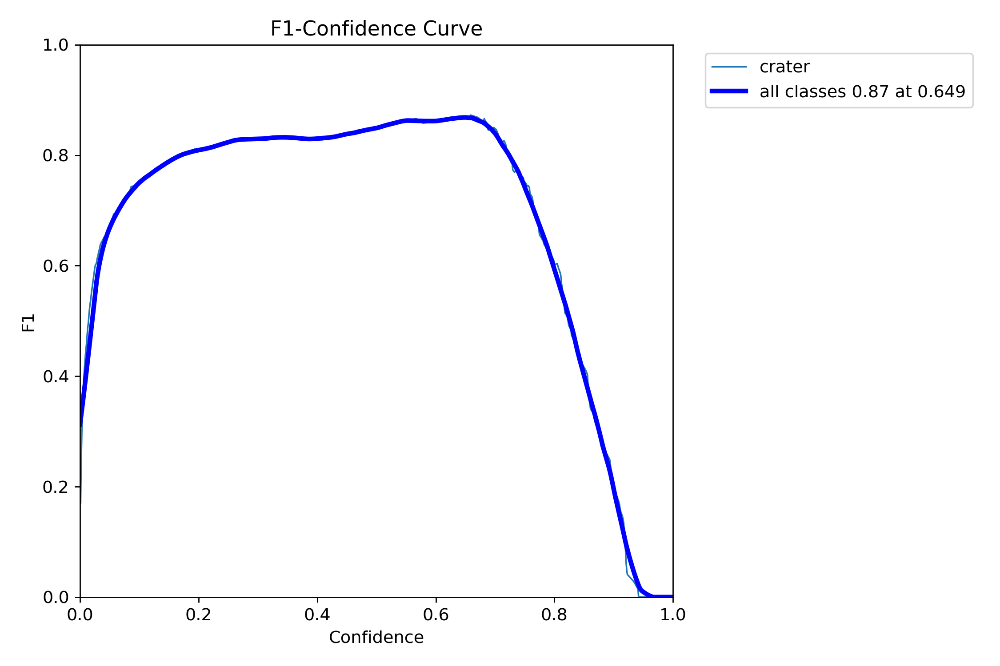

In [7]:
Image(filename='/content/drive/MyDrive/yolov5/runs/val/exp37/F1_curve.png')

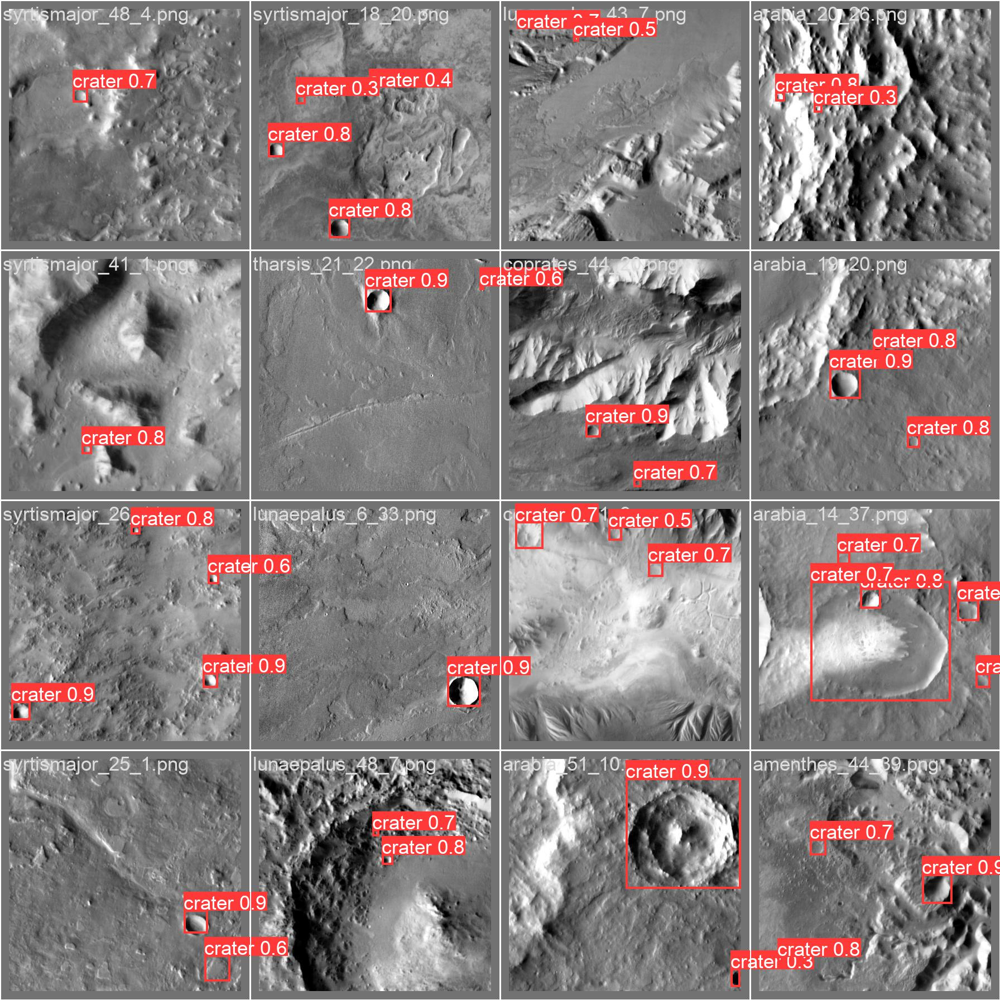

In [8]:
Image(filename='/content/drive/MyDrive/yolov5/runs/val/exp37/val_batch1_pred.jpg')

These two models have very similar results, but the large model has a larger F1 score, and in the above predictions, the model is predicting craters with higher thresholds. 

Let's look at using transfer learning on both the medium and the large trained models. It could improve the results of our models.

# Transfer Learning

## As discussed: 

- Choose the two best Models from there, and try and we will try doing some transfer learning by freezing the backbone for the initial training phase. 
  - In this training example, we decided to freeze the backbone as the backbone is where most of the feature extraction is being done - adn as it was well trained and optimised using the coco dataset, we decided to put more focus on training the Neck layers and the output layers, which are the main layers for assigning if a feature which is found in the backbone is a crater or not.
  - After first training our model with frozen backbone, we then trained the same model again, this time with no frozen layers, for less epochs. 

- Step1:
  - Freeze the Backbone (which is already well trained for detecting features)
  - Train the other parts of the model which are mostly used for the classification

- Step 2: 
  - Unfreeze and train all the layers again


### Transfer learning on Medium Model pretrained model: 
- We use the same hyperparameters, batchsize and image size, however we switch the weights from the YoloV5 pretrained weights to those we used for our medium Model. 

- We then use the --freeze line to freeze the backbone - which are the 12 first layers.

In [ ]:
# Using the High metrics with frozen Backbone  -  Also using our previously trained High Model:
!python train.py --img 416 --cfg yolov5m.yaml --hyp /content/drive/MyDrive/yolov5/data/hyps/hyp_IoU50 --batch -1  --epochs 100 --data mars.yaml --weights /content/drive/MyDrive/yolov5/runs/train/running_model_medium_05_IoU/weights/best.pt --name running_model_frozen_backbone_05_IoU --freeze 12 --single-cls 

train: weights=/content/drive/MyDrive/yolov5/runs/train/running_model_medium_05_IoU/weights/best.pt, cfg=yolov5m.yaml, data=mars.yaml, hyp=/content/drive/MyDrive/yolov5/data/hyps/hyp_IoU50, epochs=150, batch_size=-1, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=True, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=running_model_frozen_backbone_05_IoU, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[12], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-72-g064365d Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (NVIDIA A100-SXM4-40GB, 40536MiB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8

We can see how it is performing with the frozen layers

#### Now let's unfreeze the layers and train the rest:
- If I had more time I wouldv'e tried using a smaller learning rate for this part of the training to not disturb the pretrained weights too much. But I thought I current learning rate of 0.01 was small enough. Further tests should have been done if longer time. 

In [ ]:
## Unfrozen Backbone and same learning rate:
!python train.py --img 416 --cfg yolov5m.yaml --hyp /content/drive/MyDrive/yolov5/data/hyps/hyp_IoU50 --batch -1  --epochs 100 --data mars.yaml --weights /content/drive/MyDrive/yolov5/runs/train/running_model_frozen_backbone_05_IoU/weights/best.pt --name running_model_AFTER_frozen_backbone_05_IoU --single-cls 

train: weights=/content/drive/MyDrive/yolov5/runs/train/running_model_frozen_backbone_05_IoU/weights/best.pt, cfg=yolov5m.yaml, data=mars.yaml, hyp=/content/drive/MyDrive/yolov5/data/hyps/hyp_IoU50, epochs=100, batch_size=-1, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=True, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=running_model_AFTER_frozen_backbone_05_IoU, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-72-g064365d Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (NVIDIA A100-SXM4-40GB, 40536MiB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmu

Great - Let's now plot the training curves to see how the training went: 

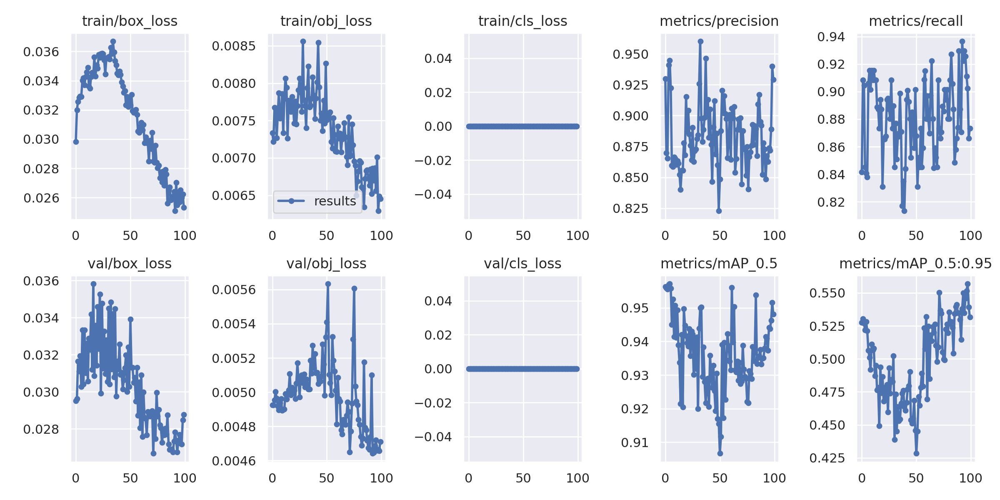

In [9]:
Image(filename='/content/drive/MyDrive/yolov5/runs/train/running_model_AFTER_frozen_backbone_05_IoU/results.png')

We can observe some suprising results. The train box loss and object loss seem to be decreasing, but in a quite eratic way. The performance metrics stay quite stable along all the 100 epochs, which is quite surprising. However our learning rate is still quite small, so it is possible that freezing the backbone has led to optimal weights being found, and therfore our further training with no layers frozen has found a local minimum.


Let's still look at how our model performs on the test set: 

In [ ]:
!python val.py --weights /content/drive/MyDrive/yolov5/runs/train/running_model_AFTER_frozen_backbone_05_IoU/weights/best.pt --data mars.yaml --img 416 --task test

val: data=/content/drive/MyDrive/yolov5/data/mars.yaml, weights=['/content/drive/MyDrive/yolov5/runs/train/running_model_AFTER_frozen_backbone_05_IoU/weights/best.pt'], batch_size=32, imgsz=416, conf_thres=0.001, iou_thres=0.6, max_det=300, task=test, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-72-g064365d Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (NVIDIA A100-SXM4-40GB, 40536MiB)

Fusing layers... 
YOLOv5m summary: 212 layers, 20852934 parameters, 0 gradients, 47.9 GFLOPs
test: Scanning /content/drive/MyDrive/yolov5/datasets/mars_sorted/labels/test.cache... 80 images, 0 backgrounds, 0 corrupt: 100% 80/80 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95:   0% 0/3 [00:00<?, ?it/s]tensor([0.64645, 0.45511], device='cuda:0')
tensor([0.76067], device='cuda:0')
tenso

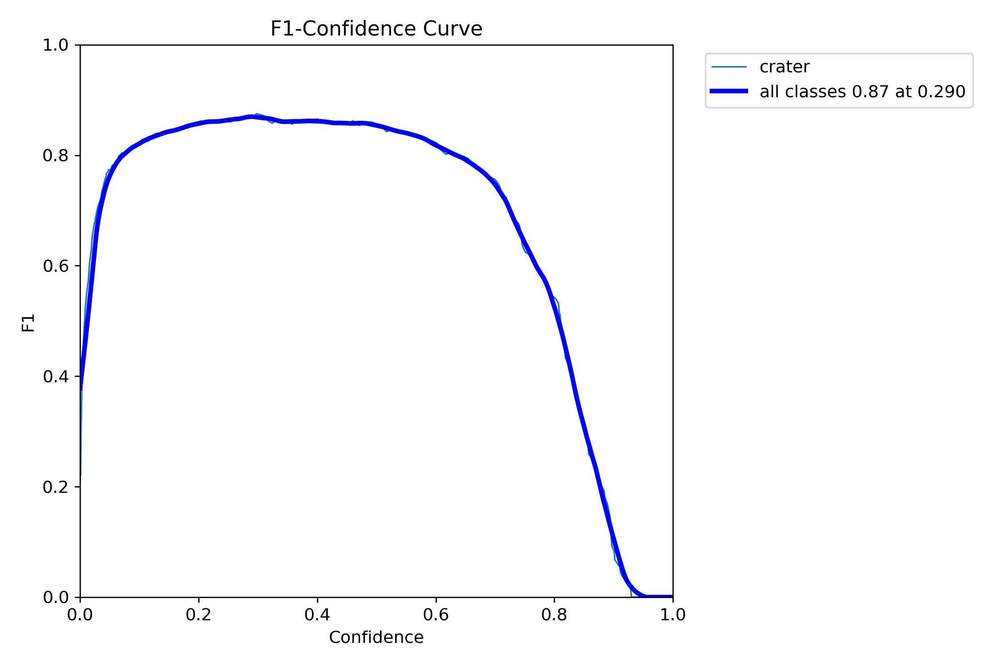

In [10]:
Image(filename='/content/drive/MyDrive/yolov5/runs/val/exp36/F1_curve.png')

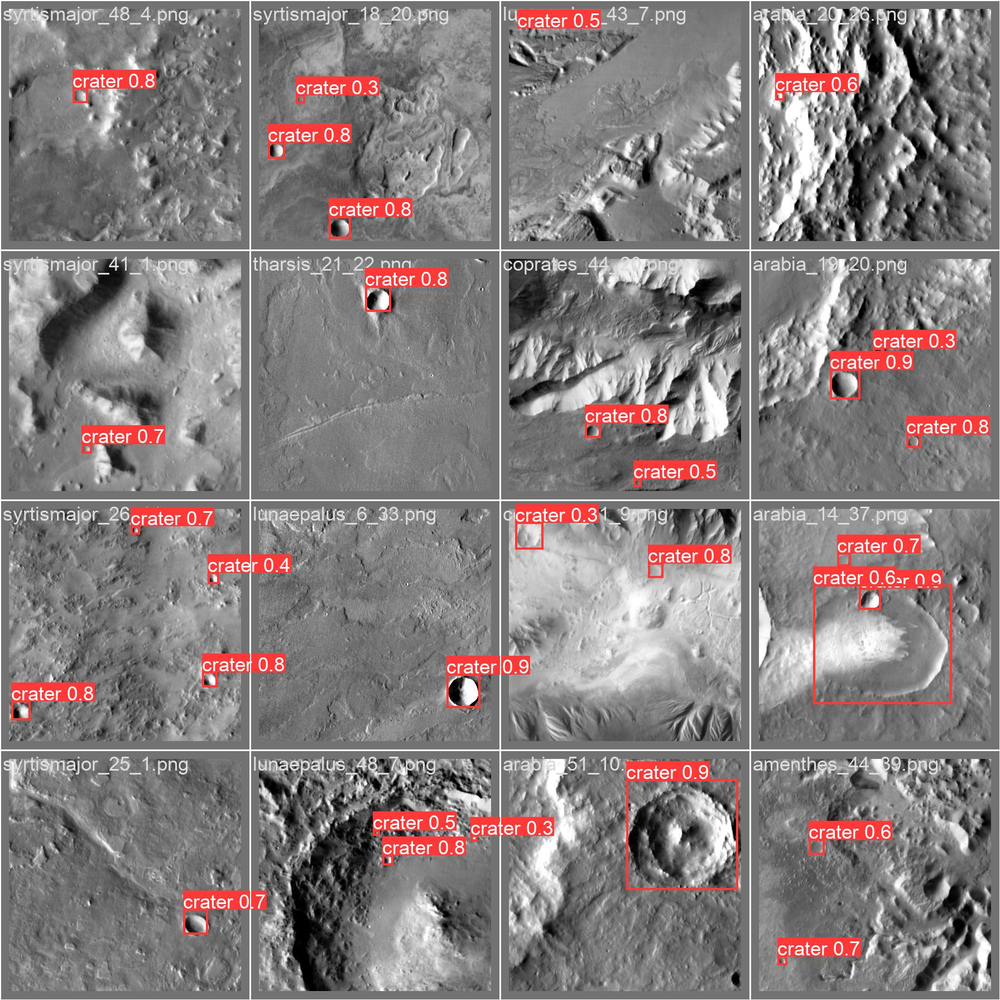

In [11]:
Image(filename='/content/drive/MyDrive/yolov5/runs/val/exp36/val_batch1_pred.jpg')

Looking at the f1 curve, we can see that our model is balanced with good precision and recall of 87% and 87%, with a mAP50 of 90%.

The predictions also look very good. Let's try the transfer learning using our large pretrained model.

## Same Transfer learning but with Large Model: 

In [ ]:
## Create the Frozen Backbone on the large Model:
!python train.py --img 416 --cfg yolov5l.yaml --hyp /content/drive/MyDrive/yolov5/data/hyps/hyp_IoU50 --batch -1  --epochs 100 --data mars.yaml --weights /content/drive/MyDrive/yolov5/runs/train/running_model_large_05_IoU/weights/best.pt --name running_model_frozen_backbone_05_IoU_large_Good --freeze 12  --single-cls 

train: weights=/content/drive/MyDrive/yolov5/runs/train/running_model_large_05_IoU/weights/best.pt, cfg=yolov5l.yaml, data=mars.yaml, hyp=/content/drive/MyDrive/yolov5/data/hyps/hyp_IoU50, epochs=100, batch_size=-1, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=True, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=running_model_frozen_backbone_05_IoU_large_Good, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[12], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-72-g064365d Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (NVIDIA A100-SXM4-40GB, 40536MiB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_mo

Now Unfreeze the Backbone and train again for 50 epochs:

In [ ]:
## Create the Frozen Backbone on the large Model:
!python train.py --img 416 --cfg yolov5l.yaml --hyp /content/drive/MyDrive/yolov5/data/hyps/hyp_IoU50 --batch -1  --epochs 100 --data mars.yaml --weights /content/drive/MyDrive/yolov5/runs/train/running_model_frozen_backbone_05_IoU_large_Good/weights/best.pt --name running_model_frozen_AFTER_backbone_05_IoU_large_Good  --single-cls 

train: weights=/content/drive/MyDrive/yolov5/runs/train/running_model_frozen_backbone_05_IoU_large_Good/weights/best.pt, cfg=yolov5l.yaml, data=mars.yaml, hyp=/content/drive/MyDrive/yolov5/data/hyps/hyp_IoU50, epochs=100, batch_size=-1, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=True, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=running_model_frozen_AFTER_backbone_05_IoU_large_Good, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-72-g064365d Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (NVIDIA A100-SXM4-40GB, 40536MiB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, wa

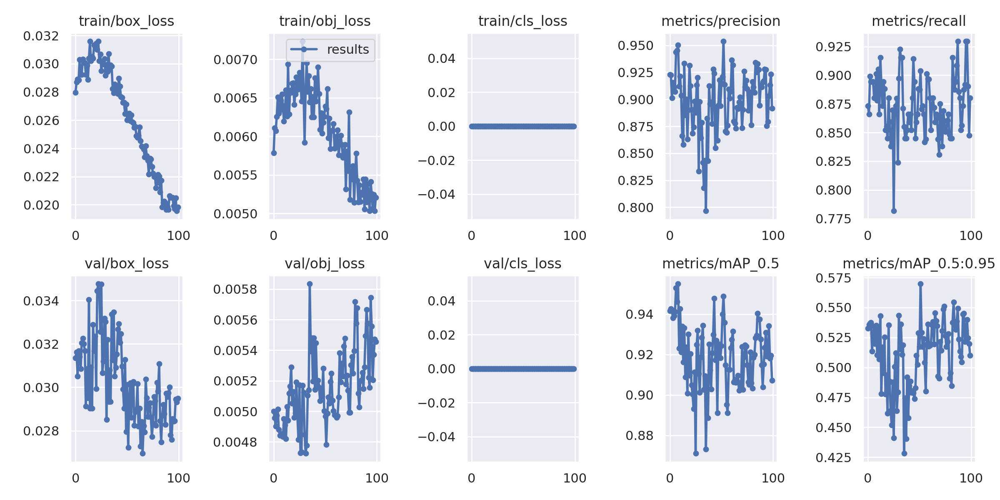

In [12]:
Image(filename='/content/drive/MyDrive/yolov5/runs/train/running_model_frozen_AFTER_backbone_05_IoU_large_Good/results.png')

Comparing the above large model with the transfer learning we did on medium sized model, we can see that we achieved much better model convergence with the large model.

Let's validate our model with the test set: 

In [ ]:
!python val.py --weights /content/drive/MyDrive/yolov5/runs/train/running_model_frozen_AFTER_backbone_05_IoU_large_Good/weights/best.pt --data mars.yaml --img 416 --task test

val: data=/content/drive/MyDrive/yolov5/data/mars.yaml, weights=['/content/drive/MyDrive/yolov5/runs/train/running_model_frozen_AFTER_backbone_05_IoU_large_Good/weights/best.pt'], batch_size=32, imgsz=416, conf_thres=0.001, iou_thres=0.6, max_det=300, task=test, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-72-g064365d Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (NVIDIA A100-SXM4-40GB, 40536MiB)

Fusing layers... 
YOLOv5l summary: 267 layers, 46108278 parameters, 0 gradients, 107.6 GFLOPs
test: Scanning /content/drive/MyDrive/yolov5/datasets/mars_sorted/labels/test.cache... 80 images, 0 backgrounds, 0 corrupt: 100% 80/80 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95:   0% 0/3 [00:00<?, ?it/s]tensor([0.80209, 0.42571, 0.37944], device='cuda:0')
tensor([0.73888], d

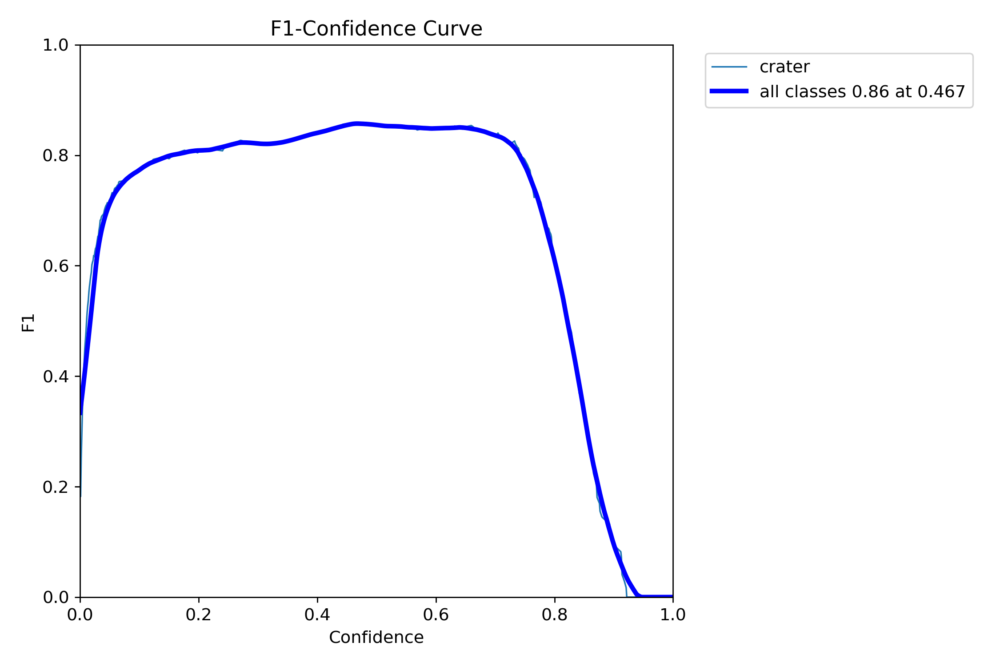

In [13]:
Image(filename='/content/drive/MyDrive/yolov5/runs/val/exp38/F1_curve.png')

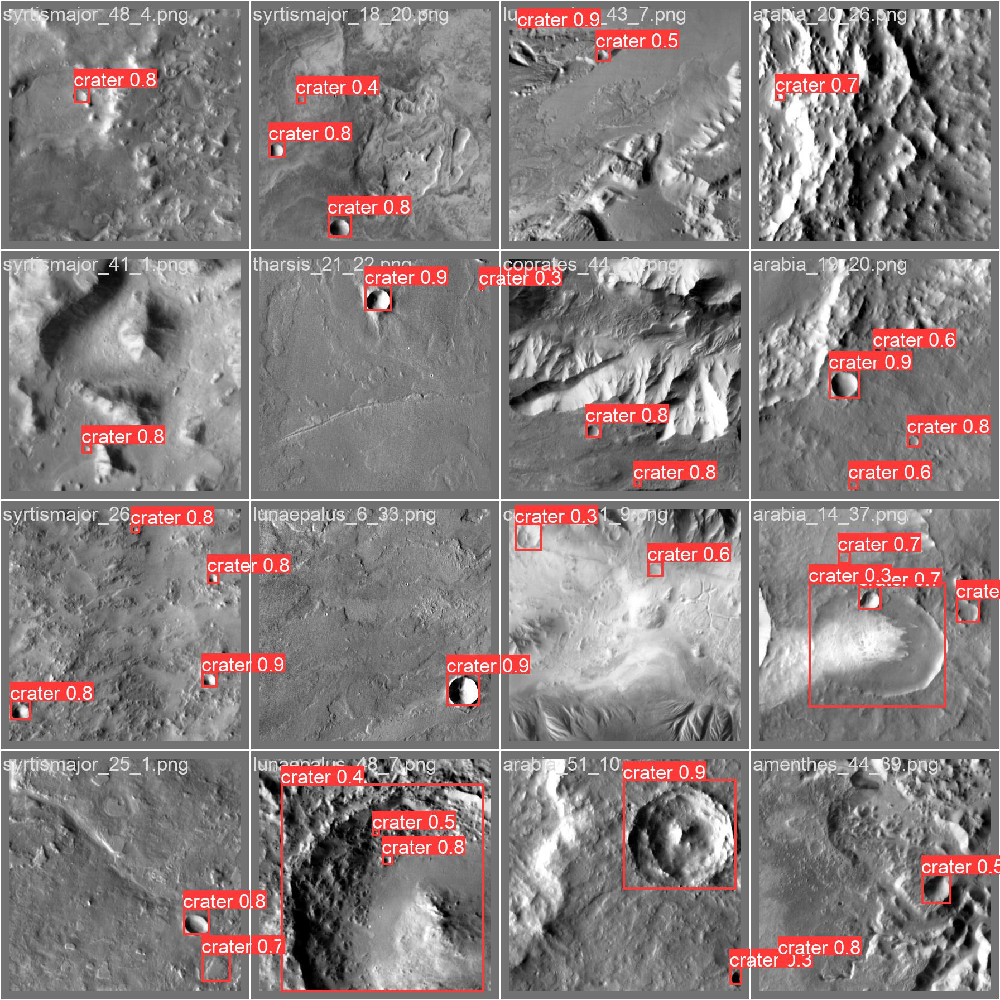

In [14]:
Image(filename='/content/drive/MyDrive/yolov5/runs/val/exp38/val_batch1_pred.jpg')

From the validation on the test set, we can see that we have a precision 87%, a recall of 84% and a mAP50 of 90%.

Looking back at our transfer learning we did on the medium sized model we had a 87% and 87% precision and recall, with a mAP50 of 90%. Which is better than with the large model.

However, comparing these models with the simple non-transfered-learning: we had: 
- Medium: 89% recall and precision at 85%. Our mAP50 is also quite high at 90%
- Large Model: precision of 88%, recall of 86% and mAP of 90%.


Given the metrics from all our current models, all our metrics seem similar however when looking at the F1 curves the most promising is that of the Large Model. It's F1 curve is of 87 for a high confidence threshold of 65%. This is by far better than all of the other models, even the medium and transfered learning models.

# Ensemble Validation: 


Now that we know the best models, we tried doing some ensembles with the best and lowest models as well as with the 2 best models. However these did not lead to significant results. 

After we know which are the best models --> we can try doing some ensembles: 

- Try worst and best together  --> Maybe it captures some variance

- Try Best and Second Best --> Two best models together could lead to improved metrics.

From the metrics, we can see that the large model alone is the best Model. Followed by the transfer learning done on the medium Model. 

The worst Model was seen to be the small model:

## So the first Ensemble we will be running is the best with the worst: 
- Medium model and the small model: This should return worst results unless our models were trained incorrectly. 

In [ ]:
!python val.py --weights /content/drive/MyDrive/yolov5/runs/train/running_model_medium_05_IoU/weights/best.pt /content/drive/MyDrive/yolov5/runs/train/running_model_baseline_Mars_05_IoU/weights/best.pt --data mars.yaml --img 416 --task test

val: data=/content/drive/MyDrive/yolov5/data/mars.yaml, weights=['/content/drive/MyDrive/yolov5/runs/train/running_model_medium_05_IoU/weights/best.pt', '/content/drive/MyDrive/yolov5/runs/train/running_model_baseline_Mars_05_IoU/weights/best.pt'], batch_size=32, imgsz=416, conf_thres=0.001, iou_thres=0.6, max_det=300, task=test, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-72-g064365d Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (NVIDIA A100-SXM4-40GB, 40536MiB)

Fusing layers... 
YOLOv5m summary: 212 layers, 20852934 parameters, 0 gradients, 47.9 GFLOPs
Fusing layers... 
YOLOv5s summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
Ensemble created with ['/content/drive/MyDrive/yolov5/runs/train/running_model_medium_05_IoU/weights/best.pt', '/content/drive/MyDrive/yolov5/runs/train/running_model_baseline_Mar

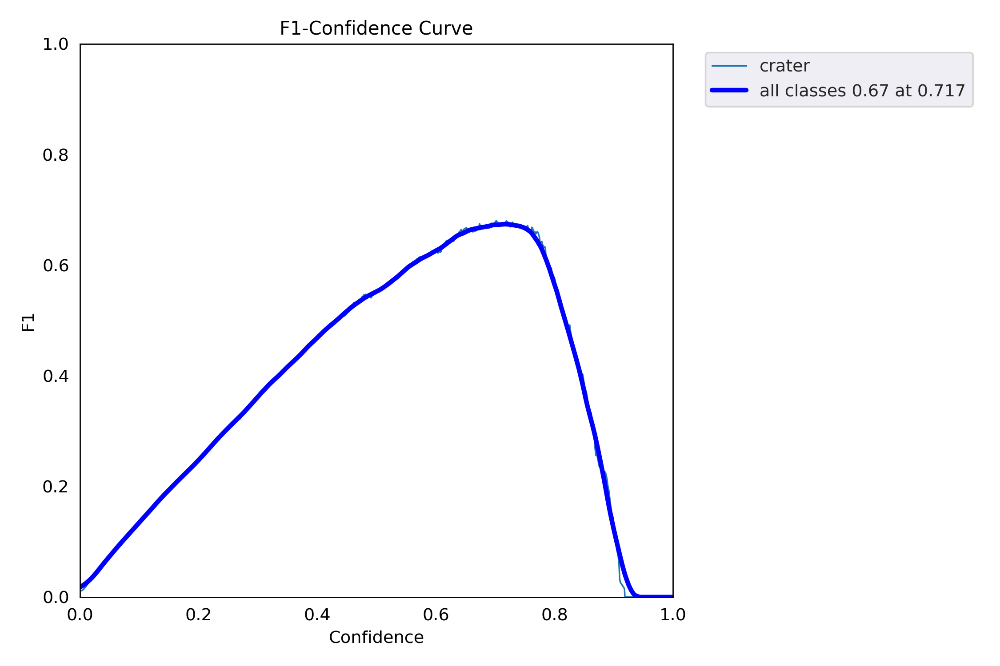

In [15]:
Image(filename='/content/drive/MyDrive/yolov5/runs/val/exp39/F1_curve.png')

We can see very low precisions, recalls and mAP50 scores. However the F1 curve has mediocre f1 score but at a higher confidence threshold. This could be interesting. However I still think the large model is the best as the F1 score is larger, but at a lower threshold, but the curve is much better shaped. 

Now Let's Test the ensemble with the 2 best Models: Medium model and the transfer learning Model (Medium): 

In [ ]:
!python val.py --weights /content/drive/MyDrive/yolov5/runs/train/running_model_medium_05_IoU/weights/best.pt /content/drive/MyDrive/yolov5/runs/train/running_model_AFTER_frozen_backbone_05_IoU/weights/best.pt  --data mars.yaml --img 416 --task test

val: data=/content/drive/MyDrive/yolov5/data/mars.yaml, weights=['/content/drive/MyDrive/yolov5/runs/train/running_model_medium_05_IoU/weights/best.pt', '/content/drive/MyDrive/yolov5/runs/train/running_model_AFTER_frozen_backbone_05_IoU/weights/best.pt'], batch_size=32, imgsz=416, conf_thres=0.001, iou_thres=0.6, max_det=300, task=test, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-72-g064365d Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (NVIDIA A100-SXM4-40GB, 40536MiB)

Fusing layers... 
YOLOv5m summary: 212 layers, 20852934 parameters, 0 gradients, 47.9 GFLOPs
Fusing layers... 
YOLOv5m summary: 212 layers, 20852934 parameters, 0 gradients, 47.9 GFLOPs
Ensemble created with ['/content/drive/MyDrive/yolov5/runs/train/running_model_medium_05_IoU/weights/best.pt', '/content/drive/MyDrive/yolov5/runs/train/running_model_AFT

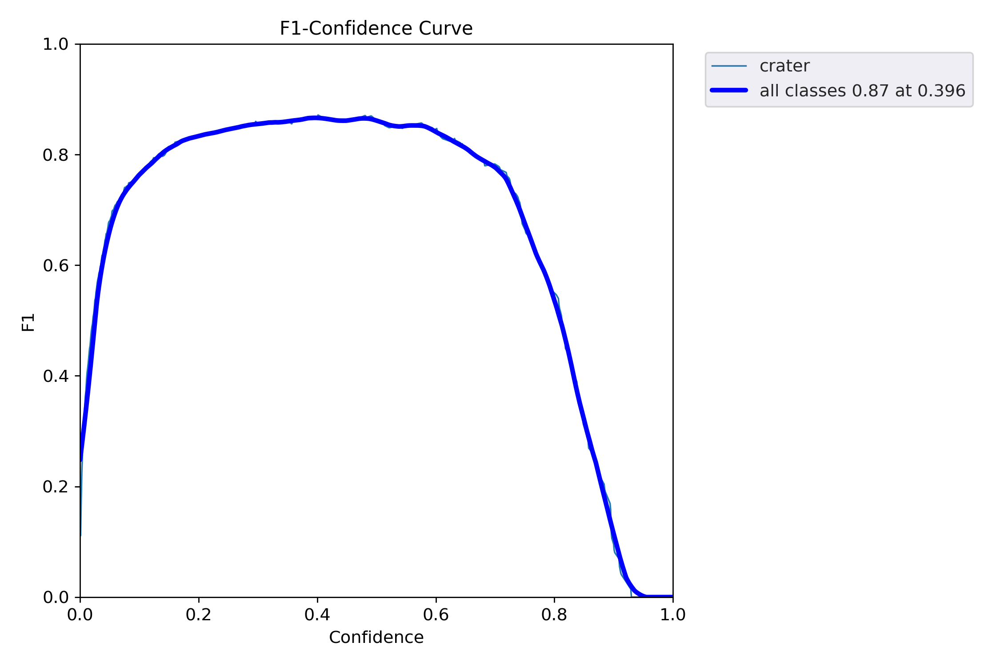

In [16]:
Image(filename='/content/drive/MyDrive/yolov5/runs/val/exp40/F1_curve.png')

This F1 curve is still well shaped, but has a lower threshold than the large model alone. 

# From all of this, we can conclude that the best current results are using the large model. This is the one we will be sticking to for our future implementations.

I think the large Model produced better results because its architecture is much deeper, with more parameters able to learn the structure of the images. In many cases having a larger model can lead to overfitting, but looking at our curves we cannot see sign of this. The validation and train loss continue to get smaller and stabilise without the validation boxloss going up. Same for the object loss. 

Final Comments: 
- We were not able to create good enough size distribution frequency distribution plots to be able to use them to determine the best model. Therefore we only looked for the highest Precision, Recall and mAP50. 

- We did not retrain our models with all the data from the train/val/test split once we were happy with the outcomes as it would've taken too much time. However we know this would have led to better results.

Extra things we would have done: 

- Maybe trying different transfer learning techniques such as freezing all the layers EXCEPT from the backbone. We think this could have led to improved results as the backbone is used to extract features from the images. Now that we think about it would've probably been great to do this. Awaiting further updates.

- Looked into manipulating the architecture of YoloV5
  - Possibly making the neck part larger (as it is primarly used to link the features processed in the backbone with the output).

# We further tried using YoloV8 for training our model and the information for the training can be seen in the other notebook YoloV8 Implementation Mars. Where we were able to reach precisions of 93%, recall 92% and mAP50 of 95%. Great results but we are still trying to implement it in our GUI. 